<center><h1> LDA Learning </h1></center>

# 1. Information

Тематическое моделирование на данных Вконтакте: использование модели LDA, визуализация топиков, построение тематических профилей.  
Цель: Боевой проект по тематическому моделированию. Цель - построить LDA модель и получить интерпретируемые топики. Попробовать посчитать тематические профили и получить их визуализацию на двумерной плоскости при помощи TSNE.  
В материалах вы можете найти выгрузку комментариев из разных музыкальных групп ВК, в полях music_style и performer можно получить информацию о конкретном музыкальном жанре и исполнителе, в группе которого был написан комментарий. Выгрузка уменьшенная, остались только комментарии длиной больше 40 слов, но тем не менее это всё ещё 500Мб, так что модельки будут считаться долго. Для отладки рекомендую брать небольшую выборку из этого датасета, чтобы на ней тестировать свой код.

# 2. Fetching Data:

## 2.1 Import packages

In [2]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ast import literal_eval

import chart_studio.plotly as py
import plotly.graph_objects as go

plt.style.use("ggplot")
%matplotlib inline

import pickle

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# Пакет для построения облаков слов
from wordcloud import WordCloud 

import umap
from tqdm import tqdm_notebook

## 2.2 Import data

In [3]:
prepare = True

In [4]:
data_full=pd.read_csv('reduced_comments_vk.csv')

In [5]:
data_full.shape

(105377, 16)

In [6]:
data=data_full

In [7]:
data.head(5)

,Unnamed: 0,audio,author,comment_id,date,dirty_text,emoji,likes,link,music_style,performer,stickers,text,video,text_bow,comment_len
0,9,NaN,146608415,52228413_282387_282503,2019-01-01 17:43:48,"[id415608045|Иван],\nВ который раз, весь мир л...",NaN,1,NaN,estrada,лепс,NaN,id415608045 иван который весь мир лететь чужое...,NaN,"['id415608045', 'иван', 'который', 'весь', 'ми...",79.0
1,103,NaN,197130573,52228413_282259_282287,2018-12-31 13:47:29,С Наступающим!. Пусть старый год уходя оставит...,NaN,2,NaN,estrada,лепс,NaN,наступать пусть старый год уходить оставить ве...,NaN,"['наступать', 'пусть', 'старый', 'год', 'уходи...",42.0
2,107,NaN,-52228413,52228413_282158_282162,2018-12-30 21:04:56,Автор музыки и слов - Дмитрий Митькин.\n\nВ ко...,NaN,29,NaN,estrada,лепс,NaN,автор музыка слово дмитрий митькина который ве...,NaN,"['автор', 'музыка', 'слово', 'дмитрий', 'митьк...",82.0
3,130,NaN,197130573,52228413_282158_282211,2018-12-30 23:04:28,Ура!!!🔥🔥🔥🔥🔥🔥🔥🔥 Предновогодняя премьера от непо...,🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥👍👍👍👍👍👍👍👍💪💪💪💪💪💪💪💪🔥🔥😎😎😎,6,NaN,estrada,лепс,NaN,ура предновогодний премьера неподражаемый непр...,NaN,"['ура', 'предновогодний', 'премьера', 'неподра...",43.0
4,190,NaN,208434900,52228413_282010_282031,2018-12-29 17:18:25,"Легко. ""Аминь""- лучший клип ГВ за последнее вр...",NaN,4,NaN,estrada,лепс,NaN,легко аминь хороший клип последний время полны...,NaN,"['легко', 'аминь', 'хороший', 'клип', 'последн...",70.0


In [8]:
bag_of_words = data.text_bow.apply(literal_eval)

In [9]:
bag_of_words.head(5)

0    [id415608045, иван, который, весь, мир, лететь...
1    [наступать, пусть, старый, год, уходить, остав...
2    [автор, музыка, слово, дмитрий, митькина, кото...
3    [ура, предновогодний, премьера, неподражаемый,...
4    [легко, аминь, хороший, клип, последний, время...
Name: text_bow, dtype: object

# 3. Formation of the dictionary and corpus of texts

In [10]:
if prepare:
    # Build the bigram and trigram models
    bigram = gensim.models.Phrases(bag_of_words, min_count=5, threshold=100) # higher threshold fewer phrases.

    # Faster way to get a sentence clubbed as a trigram/bigram
    bigram_mod = gensim.models.phrases.Phraser(bigram)
    bigram_mod.save('bigram_mod.pkl')
    
    data_words_bigrams = [bigram_mod[w] for w in bag_of_words]
    with open('bigrams.pkl', 'wb') as f:
        pickle.dump(data_words_bigrams, f)

else:
    bigram_mod = gensim.models.Phrases.load('bigram_mod.pkl')
    
    with open('bigrams.pkl', 'rb') as f:
        data_words_bigrams = pickle.load(f)

In [11]:
if prepare:
    id2word = corpora.Dictionary(data_words_bigrams)
    id2word.filter_extremes(no_below=3, no_above=0.4, keep_n=3*10**6)
    id2word.save('id2word.pkl')
else:
    id2word = corpora.Dictionary.load('id2word.pkl')

In [12]:
len(id2word)

74971

In [13]:
if prepare:
    corpus = [id2word.doc2bow(text) for text in data_words_bigrams]
    with open('corpus.pkl', 'wb') as f:
        pickle.dump(corpus, f)
else:
    with open('corpus.pkl', 'rb') as f:
        corpus = pickle.load(f)

# 3. LDA learning

In [14]:
if prepare:
    lda_model = gensim.models.ldamodel.LdaModel(
    #lda_model =  gensim.models.LdaMulticore(
        corpus         =corpus  ,
        id2word        =id2word ,
        num_topics     =30      , 
        random_state   =42      ,
        eval_every     =20      ,
        passes         =5       ,
        alpha          ='auto'  ,
        per_word_topics=True     )
    lda_model.save('lda_default.pkl')
else:
    lda_model = gensim.models.ldamodel.LdaModel.load('lda_default.pkl')

In [15]:
lda_30_topics = lda_model.show_topics(num_topics=30, num_words=100,formatted=False)

# 4. Results Visualization

## 4.1 Topics Visualization and interpretation

In [16]:
def plotWordCloud(topic_number):
    """
        Строит визуализацию слов на основе текстов топиков
    """
    # получаем частоты и слова топика
    
    text = dict(lda_30_topics[topic_number][1])
    
    # строим облако слов
    wordcloud = WordCloud(background_color="white", max_words=100, width=900, height=900, collocations=False)
    wordcloud = wordcloud.generate_from_frequencies(text)
    plt.figure(figsize=(15, 10))
    plt.title("Топик номер {}".format(topic_number))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");

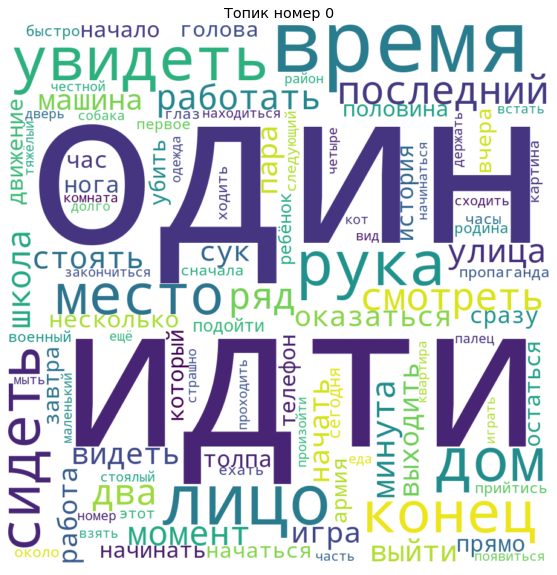

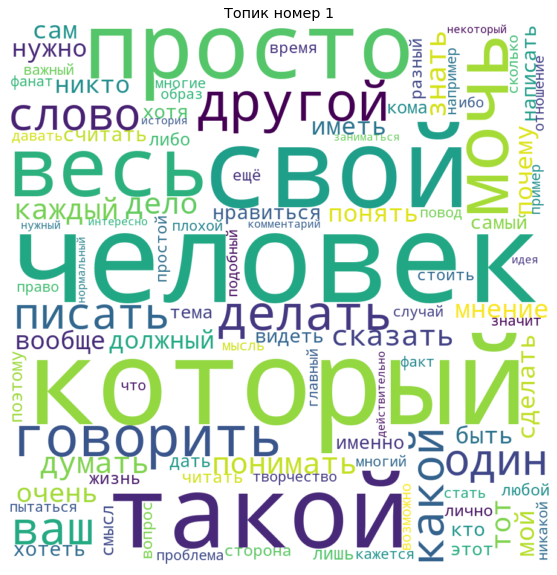

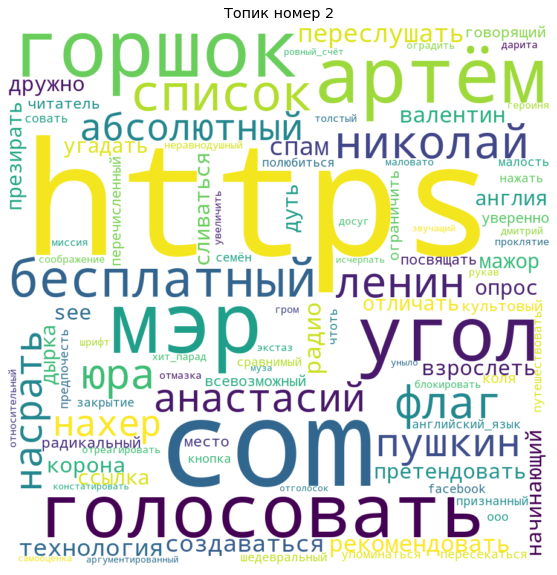

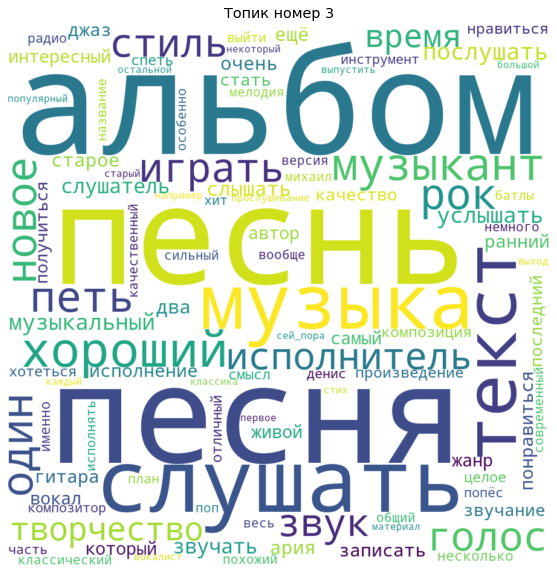

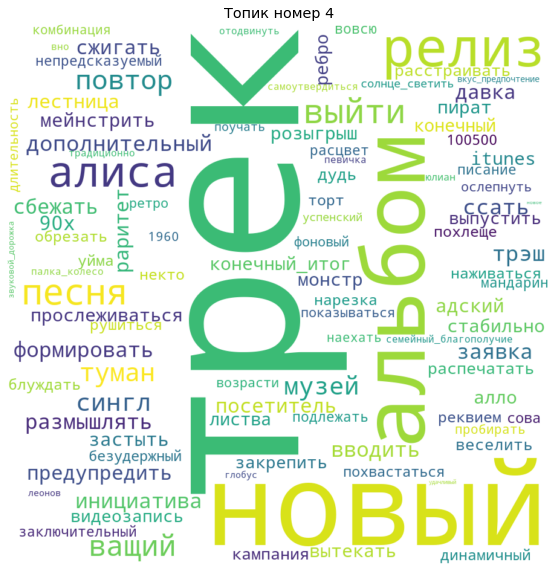

...

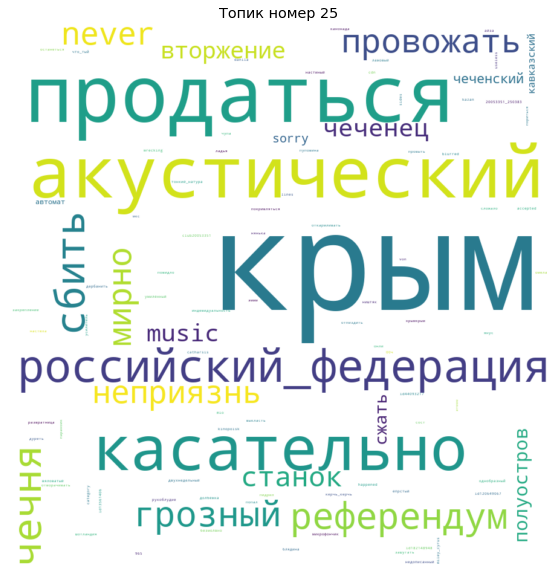

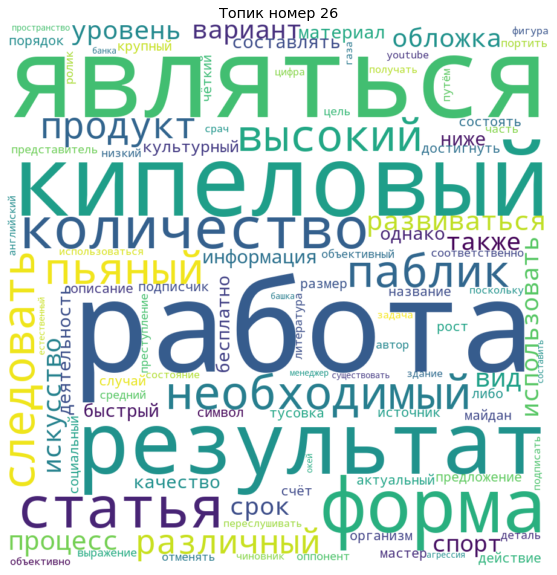

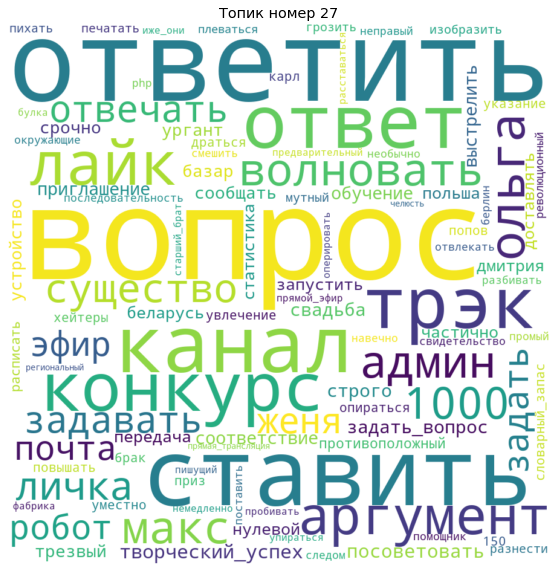

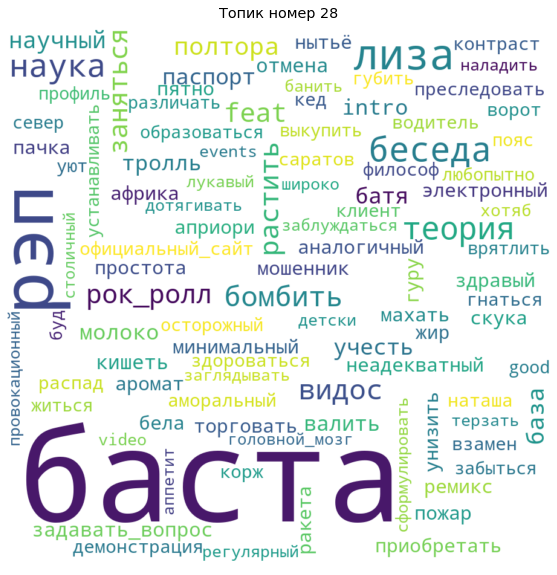

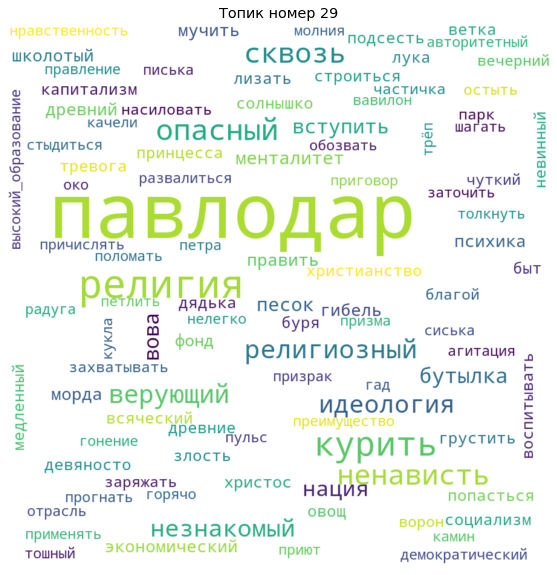

In [17]:
lda_30_topics = lda_model.show_topics(num_topics=30, num_words=100,formatted=False)
for i in range(30):
    plotWordCloud(topic_number=i)

In [18]:
themes_30 = {
0  : 'экзистенциальная тема',      1 : 'Человек и общество',
2  : 'Поэзия и политика',          3 : 'Музыкальные альбомы',
4  : 'музыкальный релиз',          5 : 'Благодарности за музыку',
6  : 'Эмоции и музыка',            7 : 'Интернет',
8  : 'Музыка',                     9 : 'Взаимоотношения',
10 : 'Поездки',                   11 : 'Ценители музыка',
12 : 'Музыкальные клипы',         13 : 'Концерты 1',
14 : 'Исполнитель в интернете',   15 : 'Концерты 2',
16 : 'Имена',                     17 : 'Россия',
18 : 'Города',                    19 : 'Фильмы и кино',
20 : 'Егор Крид',                 21 : 'Лирика и тексты',
22 : 'Поездки на концерт',        23 : 'Туры и фестивали',
24 : 'благодарности за музыку 2', 25 : 'не интерпретируемый 1',
26 : 'кипелов',                   27 : 'сми',
28 : 'баста',                     29 : 'павлоград'
}

## 4.2 Formation of topic profiles

In [19]:
def topicProfileGenre(model, music_style, dataset, corpus, genre=True):

    # Тут будем хранить результат
    theme_results = [ ]

    # Какое в модели количество топиков
    r = model.num_topics
    
    # Выбираем из таблицы те строки, которые соовтетствуют текущему жанру
    if genre:
        num = dataset[dataset.music_style == music_style].index.get_values() 
    else:
        num = dataset[dataset.performer == music_style].index.get_values() 

    # Вектор для тематического профиля жанра
    theme_profile = np.zeros(r)
    err = 0 # Для записи ошибок

    # Пробежимся по всем любителям текущего жанра
    for i in num:
        try:
            # вытаскиваем тематический профиль текущего юзера
            cur_user_prof = model.get_document_topics(corpus[i])

            # сортируем по номерам тем
            cur_user_prof = sorted(cur_user_prof, key=lambda w: w[0], reverse=True)      

            ind = [cup[0] for cup in cur_user_prof]     # делаем вектор с номерами тем
            prob = np.array([cup[1] for cup in cur_user_prof]) # делаем вектор с весами  
            theme_profile[ind] += prob        # Увеличиваем соответствующие веса
        except:
            err += 1 # Если возникла ошибка, значит профиль битый 

    # Нормируем к единице
    #print('Доля битых профилей для {}:'.format(music_style), err/len(num))
    theme_profile = theme_profile / np.sum(theme_profile)
    theme_profile = list(zip(range(30),theme_profile))
    return theme_profile

In [20]:
if (prepare):    
    music_style_themes = { }
    for music_style in tqdm_notebook(data.music_style.unique()):
        
        # Выделяем темы для текущего жанра
        theme = topicProfileGenre(lda_model, music_style, data, corpus)
        
        # Записываем их в словарик:
        music_style_themes[music_style] = theme
        
    performer_themes = { }
    for performer in tqdm_notebook(data.performer.unique()):
        
        # Выделяем темы для текущего жанра
        theme = topicProfileGenre(lda_model, performer, data, corpus, genre=False)
        
        # Записываем их в словарик:
        performer_themes[performer] = theme
        # Сохраняем словарик с тематическими профилями 
        with open('performer_themes', 'wb') as f:
            pickle.dump(performer_themes, f)
        # Сохраняем словарик с тематическими профилями 
        with open('music_style_themes', 'wb') as f:
            pickle.dump(music_style_themes, f)
else:
    # Читаем словарик с тематическими профилями 
    with open('music_style_themes', 'rb') as f:
        music_style_themes = pickle.load(f)
    
    with open('performer_themes', 'rb') as f:
        performer_themes = pickle.load(f)

In [21]:
def profilePlot(theme_profile, music_style, themes=themes_30):
    """
    Строит тематическией профиль для каждого жанра
    theme_profile:
        тематический профиль, dict
    music_style: 
        стиль музыки
    themes dict:
        названия тем
    """
    
    theme_profile = theme_profile[music_style]
    sorted_prof = sorted(theme_profile, key=lambda w: w[1], reverse=True)   
    
    # рисуем картинку
    sns.set(font_scale=2)
    plt.subplots(figsize=(30, 40))
    
    prof = np.array([pr[1] for pr in sorted_prof]).reshape(1,-1)
    them = [themes[pr[0]] for pr in sorted_prof]
    
    ax = plt.axes()    
    sns.heatmap(prof, ax = ax, square=True, annot=True, fmt=".2f", linewidths=0.1, 
                 cmap="YlGnBu", cbar=False, yticklabels='', xticklabels=them )
    ax.set_title('Тематический профиль для {}: \n'.format(music_style))
    plt.show()
    

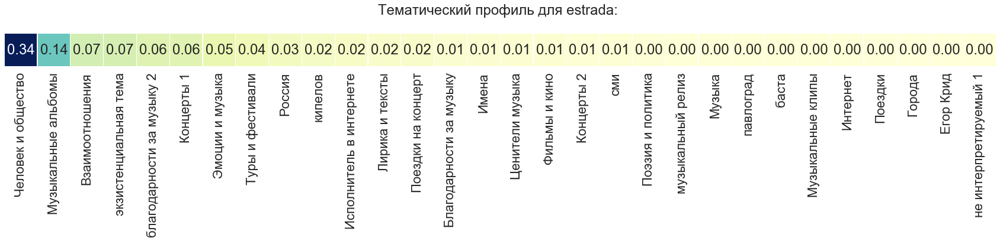

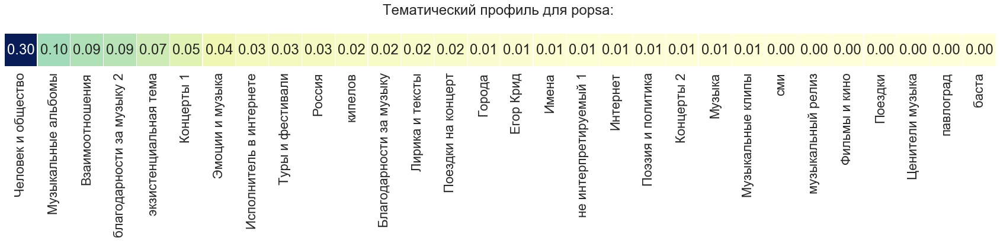

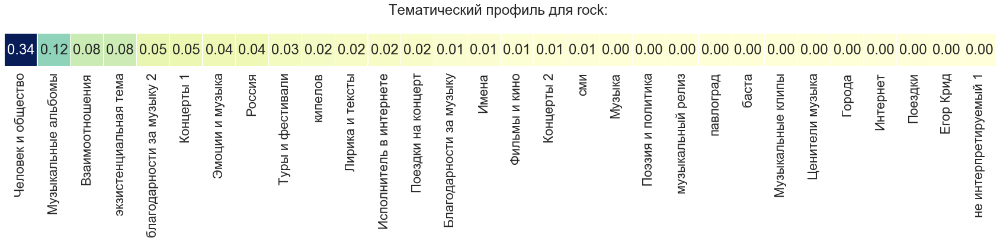

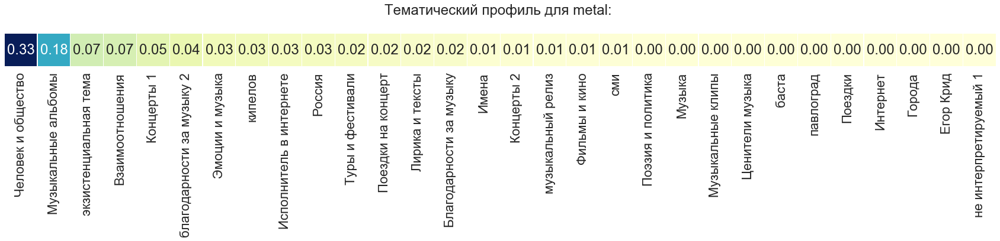

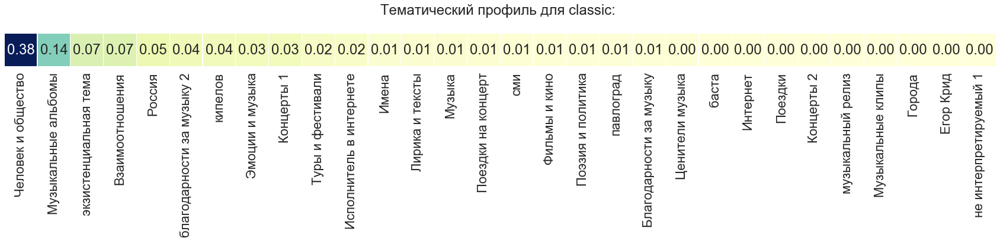

...

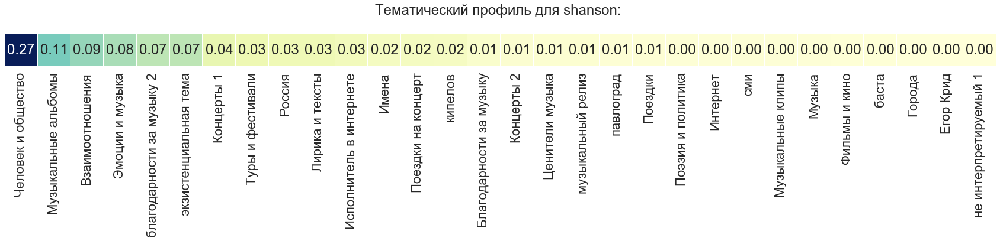

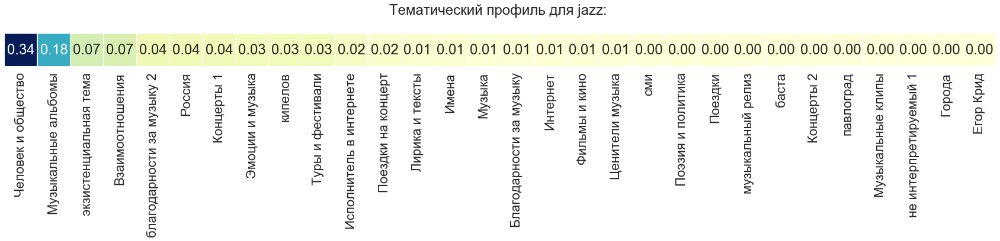

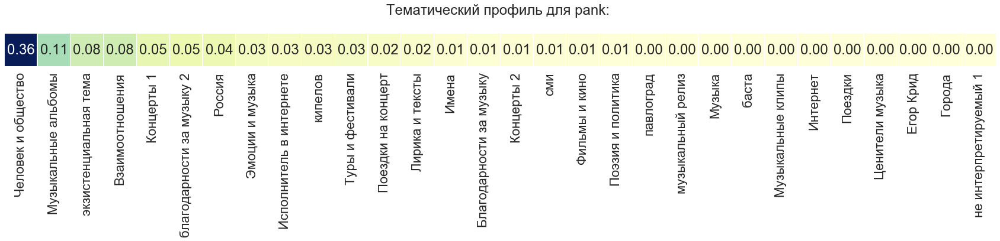

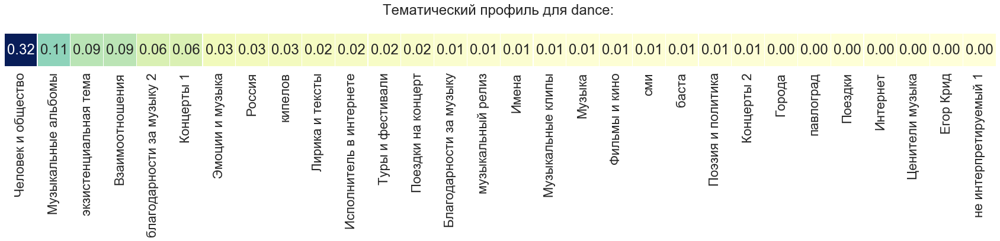

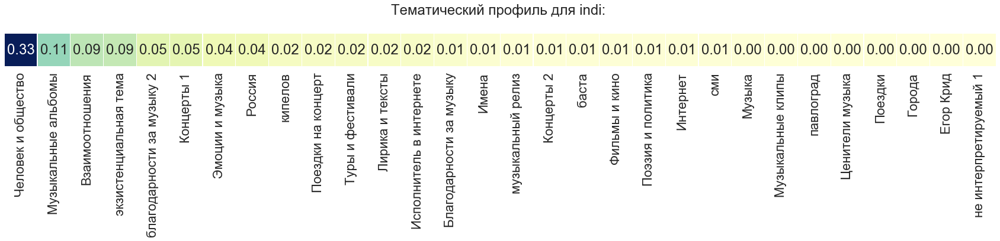

In [22]:
for music_style in data.music_style.unique():
    profilePlot(music_style_themes, music_style)

## 4.3 Visualization of topic profiles

In [25]:
music_style_themes_clusters = {}
for k, v in music_style_themes.items():
    music_style_themes_clusters[k] = [prob[1] for prob in v]
    
music_style_themes_clusters = pd.DataFrame(music_style_themes_clusters).T

In [26]:
umap_model = umap.UMAP()
umap_features = umap_model.fit_transform(music_style_themes_clusters)

In [27]:
# Create a trace
trace = go.Scatter(
    x = umap_features[:, 0],
    y = umap_features[:, 1],
    mode = 'markers+text',
    text = music_style_themes_clusters.index,
    textposition='top center'
)

data = [trace]

layout = go.Layout(
    autosize=False,
    width=700,
    height=700
)

fig = go.Figure(data=data, layout=layout)
fig.show(filename='size-margins')

На всякий случай сохранил результат визуализации UMAP, а то у меня не всегда сохранялось изображение при открытии ноутбука.

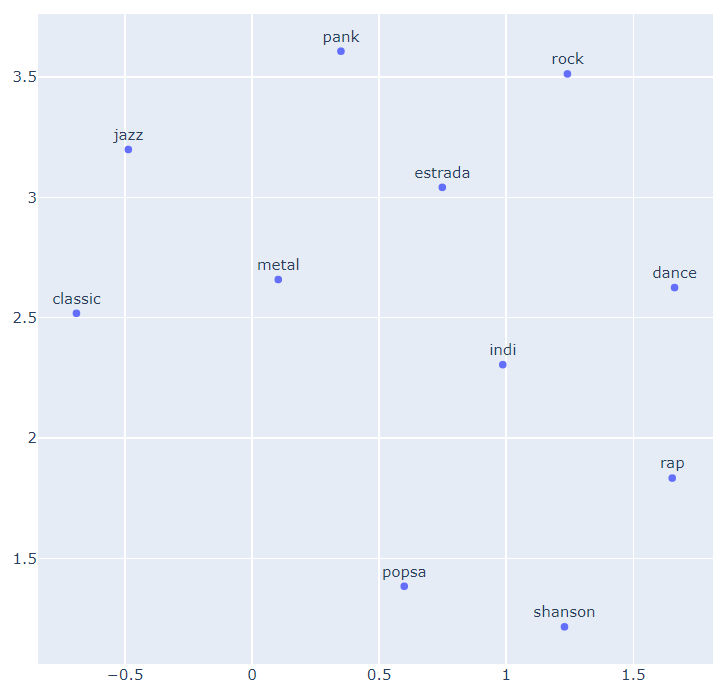